## PREPROCESSING PADA LONDON_CRIME_BY_LSOA DATASET

##### Sumber: https://www.kaggle.com/datasets/jboysen/london-crime

### Import Function

In [1]:
pip install geopy

Note: you may need to restart the kernel to use updated packages.


In [3]:
import numpy as np
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.patches as mpatches
import plotly.express as px 
import plotly.graph_objects as go
from wordcloud import WordCloud, STOPWORDS
import folium
from folium import plugins 
from geopy.geocoders import Nominatim
from urllib.request import urlopen
import json

### Read Dataset

In [4]:
df = pd.read_csv('london_crime_by_lsoa.csv')
df.head()

,lsoa_code,borough,major_category,minor_category,value,year,month
0,E01001116,Croydon,Burglary,Burglary in Other Buildings,0,2016,11
1,E01001646,Greenwich,Violence Against the Person,Other violence,0,2016,11
2,E01000677,Bromley,Violence Against the Person,Other violence,0,2015,5
3,E01003774,Redbridge,Burglary,Burglary in Other Buildings,0,2016,3
4,E01004563,Wandsworth,Robbery,Personal Property,0,2008,6


In [5]:
df.drop('lsoa_code', axis = 1, inplace=True)
df.head()

,borough,major_category,minor_category,value,year,month
0,Croydon,Burglary,Burglary in Other Buildings,0,2016,11
1,Greenwich,Violence Against the Person,Other violence,0,2016,11
2,Bromley,Violence Against the Person,Other violence,0,2015,5
3,Redbridge,Burglary,Burglary in Other Buildings,0,2016,3
4,Wandsworth,Robbery,Personal Property,0,2008,6


In [6]:
df.shape

(13490604, 6)

In [7]:
df.head(10)

,borough,major_category,minor_category,value,year,month
0,Croydon,Burglary,Burglary in Other Buildings,0,2016,11
1,Greenwich,Violence Against the Person,Other violence,0,2016,11
2,Bromley,Violence Against the Person,Other violence,0,2015,5
3,Redbridge,Burglary,Burglary in Other Buildings,0,2016,3
4,Wandsworth,Robbery,Personal Property,0,2008,6
5,Ealing,Theft and Handling,Other Theft,0,2012,5
6,Ealing,Violence Against the Person,Offensive Weapon,0,2010,7
7,Hounslow,Robbery,Personal Property,0,2013,4
8,Newham,Criminal Damage,Criminal Damage To Other Building,0,2013,9
9,Sutton,Theft and Handling,Theft/Taking of Pedal Cycle,1,2016,8


In [8]:
df.tail(10)

,borough,major_category,minor_category,value,year,month
13490594,Greenwich,Criminal Damage,Criminal Damage To Other Building,0,2008,2
13490595,Croydon,Violence Against the Person,Harassment,0,2012,1
13490596,Bromley,Theft and Handling,Theft From Shops,0,2010,7
13490597,Brent,Theft and Handling,Theft/Taking of Pedal Cycle,0,2014,10
13490598,Hillingdon,Theft and Handling,Other Theft,0,2012,2
13490599,Brent,Criminal Damage,Criminal Damage To Dwelling,0,2015,2
13490600,Hillingdon,Robbery,Personal Property,1,2015,6
13490601,Sutton,Burglary,Burglary in a Dwelling,0,2011,2
13490602,Croydon,Robbery,Business Property,0,2011,5
13490603,Merton,Violence Against the Person,Wounding/GBH,0,2015,6


### About The Data 

1. lsoa_code: berisikan kode wilayah area kepolisian
2. borough: wilayah London
3. major_category: kategori kejahatan berat
4. minor_category: kategori kejahatan ringan
5. value: jumlah kejahatan dalam kurun waktu tertentu
6. year: statistik tahunan 
7. month: statistik bulan

### Data Cleansing

#### Check Data Type 

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13490604 entries, 0 to 13490603
Data columns (total 6 columns):
 #   Column          Dtype 
---  ------          ----- 
 0   borough         object
 1   major_category  object
 2   minor_category  object
 3   value           int64 
 4   year            int64 
 5   month           int64 
dtypes: int64(3), object(3)
memory usage: 617.6+ MB


In [12]:
#change data type 
df[['borough', 'major_category', 'minor_category']] = df[['borough', 'major_category', 'minor_category']].astype('category')

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13490604 entries, 0 to 13490603
Data columns (total 6 columns):
 #   Column          Dtype   
---  ------          -----   
 0   borough         category
 1   major_category  category
 2   minor_category  category
 3   value           int64   
 4   year            int64   
 5   month           int64   
dtypes: category(3), int64(3)
memory usage: 347.4 MB


Berhasil mengurangi beban dataset dari 617 mb hingga menjadi 347 mb dengan cara merubah data typenya dari object menjadi category 

### Check Missing Value 

In [14]:
df.isna().sum()

borough           0
major_category    0
minor_category    0
value             0
year              0
month             0
dtype: int64

### Check Duplicated Data 

In [15]:
df.duplicated().sum()

13005859

In [16]:
df = df.drop_duplicates(inplace=False)
print('Jumlah duplikasi data:' + str(df.duplicated().sum()))

Jumlah duplikasi data:0


### Deskripsi Atribut Data 

In [17]:
print('--Informasi Baris dan Kolom--')
print('Baris:', df.shape[0])
print('Kolom:', df.shape[1])

--Informasi Baris dan Kolom--
Baris: 484745
Kolom: 6


In [18]:
df.head()

,borough,major_category,minor_category,value,year,month
0,Croydon,Burglary,Burglary in Other Buildings,0,2016,11
1,Greenwich,Violence Against the Person,Other violence,0,2016,11
2,Bromley,Violence Against the Person,Other violence,0,2015,5
3,Redbridge,Burglary,Burglary in Other Buildings,0,2016,3
4,Wandsworth,Robbery,Personal Property,0,2008,6


### Jumlah Missing Values 

In [19]:
df.isnull().any()

borough           False
major_category    False
minor_category    False
value             False
year              False
month             False
dtype: bool

In [21]:
df.isnull().sum().sum()

0

In [22]:
df.isnull().sum()

borough           0
major_category    0
minor_category    0
value             0
year              0
month             0
dtype: int64

### Editting Dataset

In [24]:
date = [] 
for i, j in zip(df['year'], df['month']): 
    date.append(f"{i} {j}")
df['date'] = date
df['date'] = pd.to_datetime(df['date'])
df.head()

,borough,major_category,minor_category,value,year,month,date
0,Croydon,Burglary,Burglary in Other Buildings,0,2016,11,2016-11-01
1,Greenwich,Violence Against the Person,Other violence,0,2016,11,2016-11-01
2,Bromley,Violence Against the Person,Other violence,0,2015,5,2015-05-01
3,Redbridge,Burglary,Burglary in Other Buildings,0,2016,3,2016-03-01
4,Wandsworth,Robbery,Personal Property,0,2008,6,2008-06-01


Tahap selanjutnya adalah mengurutkan data yang ada berdasarkan dengan kolom datetime yang telah dibuat untuk membuat data lebih terstruktur 

In [27]:
df = df.sort_values('date')
df = df.set_index('date')
df.head()

,borough,major_category,minor_category,value,year,month
date,,,,,,
2008-01-01,Barnet,Theft and Handling,Theft From Motor Vehicle,5,2008,1
2008-01-01,Camden,Theft and Handling,Other Theft Person,3,2008,1
2008-01-01,Islington,Theft and Handling,Theft From Motor Vehicle,8,2008,1
2008-01-01,Haringey,Theft and Handling,Other Theft,5,2008,1
2008-01-01,Islington,Violence Against the Person,Harassment,4,2008,1


### Line Plot 

#### Jumlah kejahatan tertinggi dan terendah ada di tahun berapa?

untuk mengetahui jumlahnya maka dibuat dataframe baru

In [29]:
crime_per_year = df.resample('Y')[['value']].sum()
crime_per_year

,value
date,
2008-12-31,196341
2009-12-31,193229
2010-12-31,194286
2011-12-31,200822
2012-12-31,212859
2013-12-31,194510
2014-12-31,184301
2015-12-31,192338
2016-12-31,198063


#### Visualization

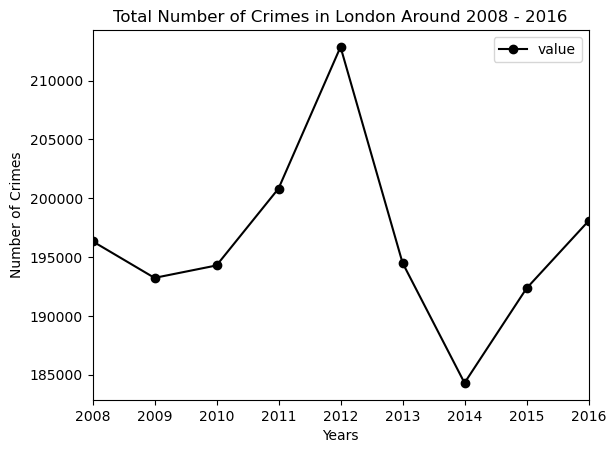

In [30]:
crime_per_year.plot(kind='line', marker='o', color='black')

plt.title('Total Number of Crimes in London Around 2008 - 2016')
plt.ylabel('Number of Crimes')
plt.xlabel('Years')

plt.show()

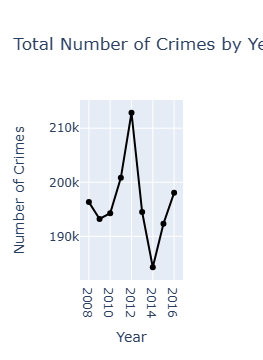

In [32]:
fig = go.Figure()
fig.add_trace(go.Scatter(x = crime_per_year.index.year,
                         y = crime_per_year.value, 
                         mode = 'lines+markers',
                         line = dict(color='black')))
fig.update_layout(title='Total Number of Crimes by Year',
                  xaxis_title = 'Year',
                  yaxis_title = 'Number of Crimes')
fig.show()

Kesimpulan: Melalui visualisasi dinyatakan bahwa total kejahatan tertinggi terletak di tahun dengan jumlah lebih dari 210.000++ dan terendah berada di tahun 2014 dan cenderung lebih kecil dari 190.000++. 

### Bar Chart 

#### Wilayah dengan total kejahatan tertinggi dan terendah di tahun 2008 - 2016 

In [35]:
sum_crime = df.drop(['major_category', 'minor_category'], axis = 1).groupby('borough').sum()
sum_crime = sum_crime.sort_values(by='value', ascending = True)
sum_crime

,value,year,month
borough,,,
City of London,660,5684736,18526
Richmond upon Thames,25192,23578223,75905
Bexley,26277,24704578,79708
Merton,26905,24921849,80395
Harrow,27289,24489532,79157
Sutton,28854,24153209,77964
Barking and Dagenham,36176,27682786,88909
Enfield,36465,28367418,91506
Havering,37488,27327368,88128


Visualisasi data di atas 

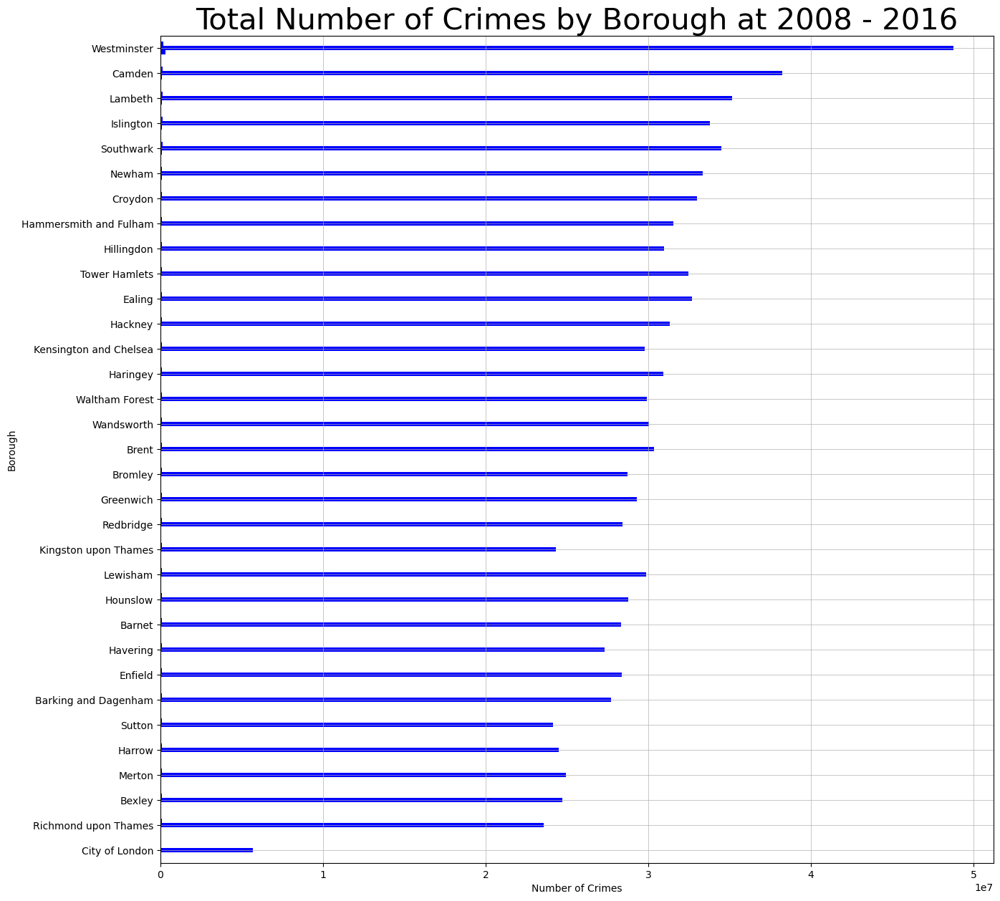

In [36]:
sum_crime.plot(kind = 'barh', figsize = (15, 15), legend = False, color = 'blue')

plt.xlabel('Number of Crimes')
plt.ylabel('Borough')
plt.grid(linewidth=0.5)
plt.title('Total Number of Crimes by Borough at 2008 - 2016', fontsize = 30)
plt.show()

Kesimpulan: Berdasarkan visualisasi di atas dapat terlihat bahwa kejahatan tertinggi pada rentang 2008 - 2016 terjadi di Westminster dengan total kejadian sebanyak 48763538 kejadian. 

### Pie Chart

#### Persentase Kejahatan yang Terjadi di Tahun 2008 - 2016

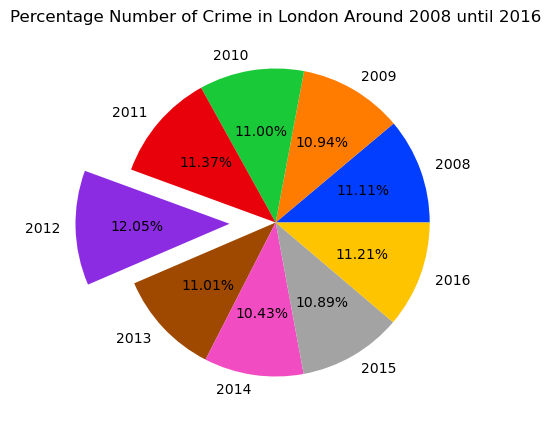

In [37]:
labels = df.resample('Y')[['value']].sum().index.year
values = df.resample('Y')[['value']].sum().value
colors = sns.color_palette('bright')[:len(df.resample('Y')[['value']].sum())]
#jarak antara data 
explode = [0,0,0,0,0.3,0,0,0,0]

plt.figure(figsize=(5,5))
plt.title('Percentage Number of Crime in London Around 2008 until 2016')
plt.pie(values, labels = labels, autopct = '%1.2f%%', colors = colors, explode = explode)
plt.show()

Kesimpulan: Melalui pie chart tersebut dapat terlihat bahwa proporsi kejahatan tertinggi diduduki oleh tahun 2012 dengan persentase yang tidak jauh berbeda dengan yang lain yaitu sebesar 12.05%. 

### Area Plot 

#### 5 Wilayah di London dengan Tingkat Kejahatan Tertinggi 

Melalukan penjumlahan kejahatan yang terjadi dari tahun 2008 hingga 2016, kemudian mengurutkan dari wilayah yang memiliki tingkat kejahatan tertinggi.

In [38]:
top_5_borough = df.groupby('borough')[['value']].sum().sort_values('value', ascending = False).head().index
top_5_borough

CategoricalIndex(['Westminster', 'Camden', 'Lambeth', 'Islington',
                  'Southwark'],
                 categories=['Barking and Dagenham', 'Barnet', 'Bexley', 'Brent', ..., 'Tower Hamlets', 'Waltham Forest', 'Wandsworth', 'Westminster'], ordered=False, dtype='category', name='borough')

In [39]:
top_5_crime = df[df['borough'].isin(top_5_borough)][['borough', 'value']]
top_5_crime = top_5_crime.groupby(['borough', top_5_crime.index.year])[['value']].sum()
top_5_crime = top_5_crime.reset_index()
top_5_crime

,borough,date,value
0,Barking and Dagenham,2008,0
1,Barking and Dagenham,2009,0
2,Barking and Dagenham,2010,0
3,Barking and Dagenham,2011,0
4,Barking and Dagenham,2012,0
...,...,...,...
292,Westminster,2012,39164
293,Westminster,2013,35011
294,Westminster,2014,28422
295,Westminster,2015,27697


Memvisualisasikan top 5 wilayah dengan kejahatan tertinggi menggunakan area plot 

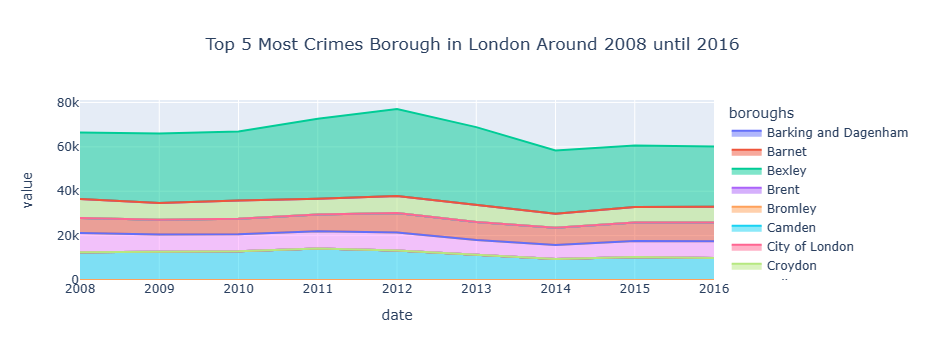

In [40]:
fig = px.area(top_5_crime, x = 'date', y = 'value', color = 'borough', title = 'Top 5 Most Crimes Borough in London Around 2008 until 2016')
fig.update_layout(title_x = 0.5, legend = dict(title = 'boroughs'))
fig.show()

Kesimpulan: melalui hasil visualisasi dapat terlihat bahwa top 5 kejahatan di London terjadi di wilayah Westminster, Southwark, Newham, Lambeth, dan Camden. 

### Scatter Plot 

#### Persebaran dari Total Kejahatan Setiap Bulannya di Tahun 2008 - 2016 

In [41]:
value_per_month = df.groupby('date')[['value']].sum()
value_per_month = value_per_month.reset_index()
value_per_month

,date,value
0,2008-01-01,17461
1,2008-02-01,17197
2,2008-03-01,16267
3,2008-04-01,15663
4,2008-05-01,16379
...,...,...
103,2016-08-01,16986
104,2016-09-01,16245
105,2016-10-01,17110
106,2016-11-01,16933


Memvisualisasikan data persebaran total kejahatan per bulannya di tahun 2008 hingga 2016 

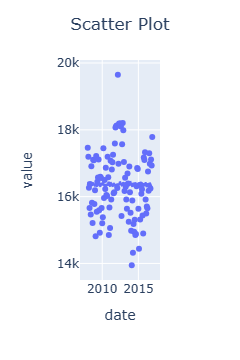

In [42]:
fig = px.scatter(value_per_month, x = 'date', y = 'value', trendline = 'ols')
fig.update_layout(title = 'Scatter Plot', title_x = 0.5)
fig.show()

Melalui visualisasi di atas dapat terlihat bahwa data dari scatter plot cenderung menyebar dan tidak membentuk suatu pola. Terlihat juga bahwa besar pengaruh variabel independen terhadap variabel dependen cukuplah kecil dibuktikan dengan adanya R^2 garis regresi olsnya lebih mendekati 0 dibandingkan 1. 

### Histogram dan Box Plot 

#### Persebaran Jumlah Kejahatan yang Terjadi di Newham 

Membuat dataframe baru dengan menggunakan data Newham untuk mengetahui jumlah kejadian kejahatan di Newham

In [43]:
Newham = df.loc[df['borough']=='Newham'][['value']].resample('M').sum()
Newham.head()

,value
date,
2008-01-31,691
2008-02-29,612
2008-03-31,619
2008-04-30,523
2008-05-31,576


Data di atas kemudian divisualisasikan menggunakan histogram dan boxplot untuk mengetahui persebaran kegiatannya lebih mudah 

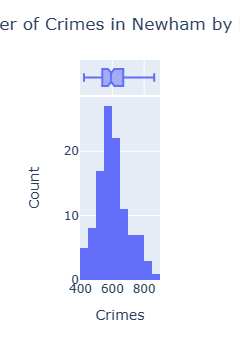

In [44]:
fig = go.Figure()
fig = px.histogram(Newham, x ='value', barmode='stack', marginal='box')
fig.update_layout(title='Number of Crimes in Newham by Month',
                  title_x=0.5,
                  xaxis_title='Crimes',
                  yaxis_title='Count')
fig.show()

Kesimpulan: Melalui boxplot terlihat bahwa data min nya adalah 422, data maxnya adalah 863, dan data mediannya adalah 592,5. Tak hanya itu, diketahui juga nilai quartilnya, juga dapat dilihat satu outliers (pencilan). Sementara data histogram datanya cenderung simetris. 

### Word Clouds 

#### Jenis Kejahatan yang Cenderung Muncul pada Kategori Minor di Tahun 2009 

Membuat visualisasi dengan menggunakan WordClouds untuk memunculkan data kejahatan dengan kategori minor yang paling sering muncul 

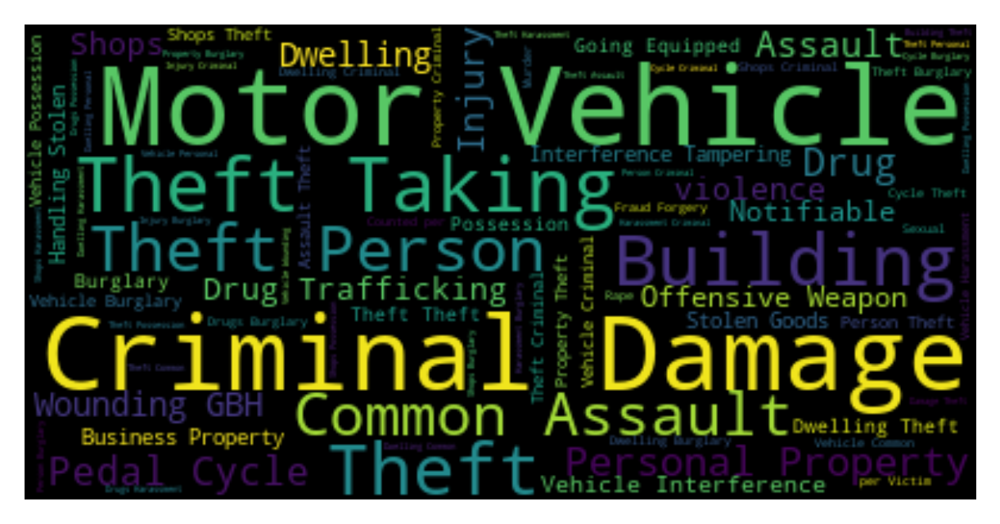

In [45]:
stopwords = set(STOPWORDS)

plt.figure(figsize=(5,5), dpi = 300)
crimes_wordcloud = WordCloud(background_color = 'black', 
                             stopwords=stopwords).generate(" ".join(df.loc['2009']['minor_category']))
plt.imshow(crimes_wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.show()

Kesimpulan: Melalui Wordcloud di atas dapat terlihat bahwa kata yang paling sering muncul pada data kejahatan kategori minor di tahun 2009 adalah Motor, Vehicle, Criminal, dan Damage. 

### Folium Maps 

#### Bagaimana Tingkat Kejahatan di Seluruh Wilayah London? 

Untuk mengetahui tingkat kejahatan di seluruh wilayah maka dilakukan pengurutan dataset berdasarkan kolom wilayah

In [46]:
sort_borough_crime = df.sort_values('borough')
sort_borough_crime.head()

,borough,major_category,minor_category,value,year,month
date,,,,,,
2012-04-01,Barking and Dagenham,Drugs,Drug Trafficking,1,2012,4
2015-05-01,Barking and Dagenham,Criminal Damage,Criminal Damage To Motor Vehicle,5,2015,5
2013-08-01,Barking and Dagenham,Theft and Handling,Other Theft,1,2013,8
2009-03-01,Barking and Dagenham,Violence Against the Person,Common Assault,1,2009,3
2009-03-01,Barking and Dagenham,Criminal Damage,Criminal Damage To Motor Vehicle,1,2009,3


Mengumpulkan titik latitude dan longitude dari masing - masing wilayah yang ada 

In [48]:
geolocator = Nominatim(user_agent='MyApp')

latitude = []
longitude = []

for i in sort_borough_crime['borough'].unique():
    location = geolocator.geocode(i, timeout=None)
    latitude.append(location.latitude)
    longitude.append(location.longitude)

Dibagi atau split per daerah 

In [49]:
split_londonborough = []
for i in sort_borough_crime['borough'].unique(): 
    split = sort_borough_crime[sort_borough_crime['borough'] == i]
    split_londonborough.append(split)

Memasukkan latitude dan longitude untuk setiap wilayah

In [53]:
for i, j, k in zip(split_londonborough, latitude, longitude):
    i.insert(5, 'latitude', j)
    i.insert(6, 'longitude', k)

Menggabungkan dataset dan diurutkan berdasarkan index 

In [54]:
londonborough_loc = pd.concat(split_londonborough).sort_index()
londonborough_loc.head()

,borough,major_category,minor_category,value,year,latitude,longitude,month
date,,,,,,,,
2008-01-01,Hackney,Burglary,Burglary in a Dwelling,6,2008,51.543240,-0.049362,1
2008-01-01,Hammersmith and Fulham,Violence Against the Person,Offensive Weapon,4,2008,51.498314,-0.227878,1
2008-01-01,Islington,Violence Against the Person,Harassment,1,2008,51.538429,-0.099905,1
2008-01-01,Enfield,Criminal Damage,Criminal Damage To Dwelling,1,2008,51.652085,-0.081018,1
2008-01-01,Barnet,Robbery,Personal Property,1,2008,51.653090,-0.200226,1


Untuk mengurangi computational cost, maka diambil 10.000 sample dari dataset

In [55]:
n_sample = 10000

londonborough_loc_2008 = londonborough_loc.loc['2008']
londonborough_loc_2008 = londonborough_loc_2008.sample(n=n_sample, random_state = 1221, axis = 0)
londonborough_loc_2008.head()

,borough,major_category,minor_category,value,year,latitude,longitude,month
date,,,,,,,,
2008-06-01,Hackney,Criminal Damage,Criminal Damage To Dwelling,0,2008,51.543240,-0.049362,6
2008-11-01,Greenwich,Criminal Damage,Criminal Damage To Other Building,0,2008,51.468626,0.048831,11
2008-02-01,Camden,Theft and Handling,Motor Vehicle Interference & Tampering,0,2008,39.944840,-75.119891,2
2008-09-01,Havering,Theft and Handling,Theft From Motor Vehicle,1,2008,50.137713,-5.682694,9
2008-03-01,Ealing,Drugs,Drug Trafficking,0,2008,51.512655,-0.305195,3


Mencari nilai latitude dan longitude 

In [56]:
london = geolocator.geocode('London')

print(f"London's latitude\t:{london.latitude}")
print(f"London's longitude\t:{london.longitude}")

London's latitude	:51.5074456
London's longitude	:-0.1277653


Membuat folium map untuk dapat mengetahui persebaran kejahatan di London

In [57]:
london_map = folium.Map(location=[london.latitude, london.longitude], zoom_start=10)

london_crimes_map = plugins.MarkerCluster().add_to(london_map)

for i, j, k in zip(londonborough_loc_2008['latitude'], londonborough_loc_2008['longitude'], londonborough_loc_2008['major_category']):
                    folium.Marker(
                    location=[i,j],
                    icon = None,
                    popup = k
                    ).add_to(london_crimes_map)
        
london_map